Imports and paths setup

In [ ]:
from sys import platform

if platform == "linux" or platform == "linux2":
    !pip install -U albumentations
    !pip install xmltodict
    !pip install imagesize
    !pip install nvidia-dali-cuda120
    !pip install ultralytics

    !git clone https://gitlab.com/HubertDomaros/ai-capstone-proj --branch dev
    import os
    os.chdir(os.path.join(os.getcwd(), 'ai-capstone-proj'))
    os.getcwd()

    from src.nvidia_dali_resizer import resize_with_dali

In [3]:
import src.utils
from src.std_imports import os, pd
import torch

from src import annotations_processing as ap
from src import image_processing as ip
from src import constants as c
from src import utils

if platform == "linux" or platform == "linux2":
    pascal_dataset_dir = '/kaggle/input/codebrim-original/original_dataset'
    yolo_dataset_dir = '/kaggle/working/ai-capstone-proj/datasets'

else:
    pascal_dataset_dir = os.path.join(os.getcwd(), r'kaggle\input\codebrim-original\original_dataset')
    yolo_dataset_dir = os.path.join(os.getcwd(), r'datasets')

pascal_img_dir = os.path.join(pascal_dataset_dir, 'images')
pascal_annotations_dir = os.path.join(pascal_dataset_dir, 'annotations')
yolo_images_dir = os.path.join(yolo_dataset_dir, 'images')
yolo_labels_dir = os.path.join(yolo_dataset_dir, 'labels')

pascal_df: pd.DataFrame = ap.xml_annotations_to_dataframe(pascal_annotations_dir)

pascal_df

,img,img_width,img_height,xmin,ymin,xmax,ymax,Background,Crack,Spallation,Efflorescence,ExposedBars,CorrosionStain
0,image_0000499.jpg,4608,3456,1368,1563,1852,1710,0,1,0,0,0,0
1,image_0000499.jpg,4608,3456,889,2774,1855,3037,0,1,0,0,0,0
2,image_0000499.jpg,4608,3456,673,1155,1405,1268,0,1,0,0,0,0
3,image_0000499.jpg,4608,3456,465,137,1194,255,0,1,0,0,0,0
4,image_0000499.jpg,4608,3456,3829,1097,4294,1239,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5256,image_0001095.jpg,4608,3456,2752,2781,3097,3113,0,1,0,0,0,1
5257,image_0001095.jpg,4608,3456,4076,205,4608,938,0,0,1,0,1,1
5258,image_0001095.jpg,4608,3456,1858,689,4160,2979,0,0,1,0,1,0
5259,image_0001095.jpg,4608,3456,1587,129,4597,3456,0,0,1,0,1,0


Not all images are listed as in labels directory, thus we need to add them to the dataframe manually

In [5]:
pascal_df = ap.fill_missing_imgs_in_df(pascal_img_dir, pascal_df)
pascal_df.sort_values(by=[c.IMG], ascending=True, inplace=True)
pascal_df

,img,img_width,img_height,xmin,ymin,xmax,ymax,Background,Crack,Spallation,Efflorescence,ExposedBars,CorrosionStain
5747,image_0000001.jpg,1712,2572,0,0,0,0,1,0,0,0,0,0
5677,image_0000002.jpg,1732,2596,0,0,0,0,1,0,0,0,0,0
5449,image_0000003.jpg,1732,2596,0,0,0,0,1,0,0,0,0,0
5727,image_0000004.jpg,1688,2532,0,0,0,0,1,0,0,0,0,0
5198,image_0000005.jpg,1904,2856,1507,505,1904,2856,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4823,image_0001599.jpg,4608,3456,2627,463,3066,2000,0,0,0,0,0,1
4822,image_0001599.jpg,4608,3456,3653,2813,4008,3365,0,0,1,0,1,1
4821,image_0001599.jpg,4608,3456,3339,734,3736,2826,0,0,0,0,0,1
4820,image_0001599.jpg,4608,3456,2092,471,2416,1178,0,0,0,0,0,1


Converting labels to format required by YOLO model

In [6]:
yolo_df = ap.pascal_df_to_yolo(pascal_df)
yolo_df[yolo_df[c.yolo_cols_list[3:7]].gt(1).any(axis=1)]

,img,img_width,img_height,Background,Crack,Spallation,Efflorescence,ExposedBars,CorrosionStain,multihot_encoding_class,x_center,y_center,bbox_width,bbox_height


In [7]:
ap.save_yolo_annotations(yolo_df, yolo_labels_dir)

Saved 1590 annotations to /kaggle/working/ai-capstone-proj/datasets/labels


Splitting dataset into test, train and validation datasets (explanation: https://encord.com/blog/train-val-test-split/)

In [ ]:
train_test_val = src.utils.train_test_val_image_split(yolo_df, test_size=0.2, val_size=0.1)
train_test_val['train'][0]

'image_0000001.jpg'

In [9]:
# Checking whether GPU is available
cuda_avail = torch.cuda.is_available()

Resizing images to size (640, 640) required by YOLO model

In [10]:
if platform == "linux" or platform == "linux2" and torch.cuda.is_available():
    resize_with_dali(pascal_img_dir, yolo_images_dir)
# elif not os.path.exists(yolo_images_dir):
#     os.makedirs(yolo_images_dir, exist_ok=True)
#     ip.resize_images_pytorch(input_dir=pascal_img_dir, output_dir=yolo_images_dir,
#                             target_width=640, target_height=640, delete_output_dir=True)

Input directory exists: True
Is directory: True

First 5 files in directory:
['image_0000001.jpg', 'image_0000002.jpg', 'image_0000003.jpg', 'image_0000004.jpg', 'image_0000005.jpg']

Total files: 1590

Full paths of first few files:
/kaggle/input/codebrim-original/original_dataset/images/image_0000001.jpg (exists: True)
/kaggle/input/codebrim-original/original_dataset/images/image_0000002.jpg (exists: True)
/kaggle/input/codebrim-original/original_dataset/images/image_0000003.jpg (exists: True)

Created file list at temp_file_list.txt
First few lines of file list:
['/kaggle/input/codebrim-original/original_dataset/images/image_0000001.jpg 0', '/kaggle/input/codebrim-original/original_dataset/images/image_0000002.jpg 0', '/kaggle/input/codebrim-original/original_dataset/images/image_0000003.jpg 0']

Trying to create and build pipeline...
Pipeline built successfully!

Processing and saving images:
Processed 100/1590 images
Processed 200/1590 images
Processed 300/1590 images
Processed 40

In [ ]:
if platform == "linux" or platform == "linux2":
    utils.put_imgs_in_folders(train_test_val, yolo_images_dir, yolo_images_dir)
else:
    utils.put_imgs_in_folders(train_test_val, r'images\images_resized', yolo_images_dir)

utils.put_labels_in_folders(train_test_val, yolo_labels_dir, yolo_labels_dir)

In [12]:
if platform == "linux" or platform == "linux2":
    %load_ext tensorboard
    %tensorboard --logdir kaggle\working\datasets\runs

<IPython.core.display.Javascript object>

Finally, we load preprocessed data into the model and start training

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")
results = model.train(data="yolo_kaggle.yaml", epochs=100, imgsz=640, device='0', batch=32)

Here should be output of the training logs. I cleaned the output to improve notebook readability :)

# Training Results

In [ ]:
import os
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np

confusion_matrix.png


<Figure size 1000x1000 with 0 Axes>

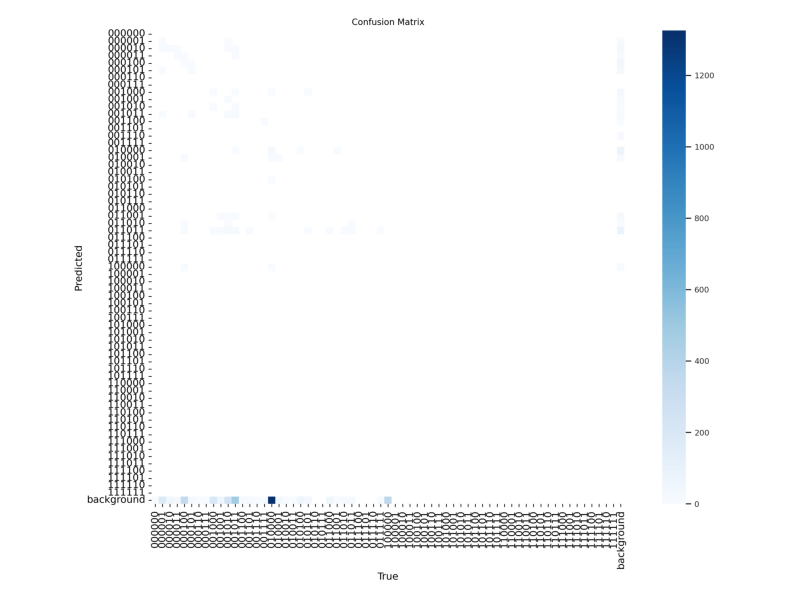


confusion_matrix_normalized.png


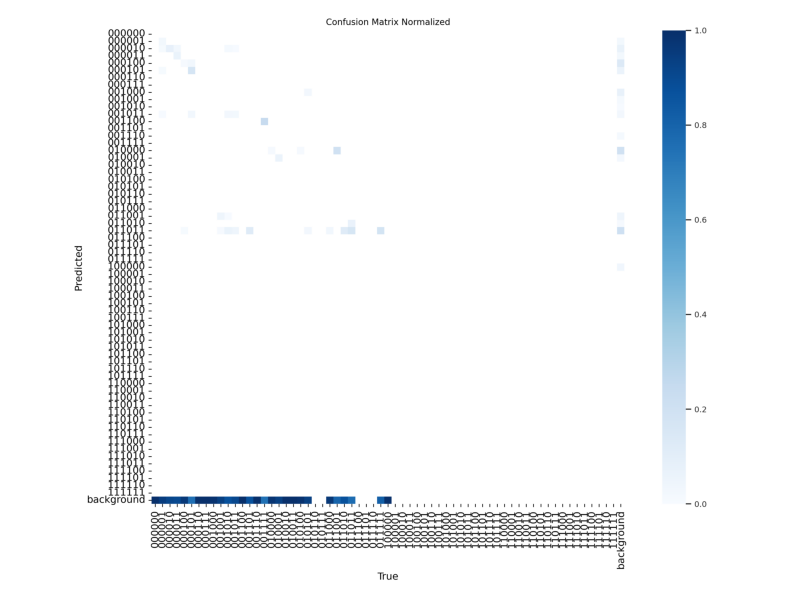


F1_curve.png


<Figure size 1000x1000 with 0 Axes>

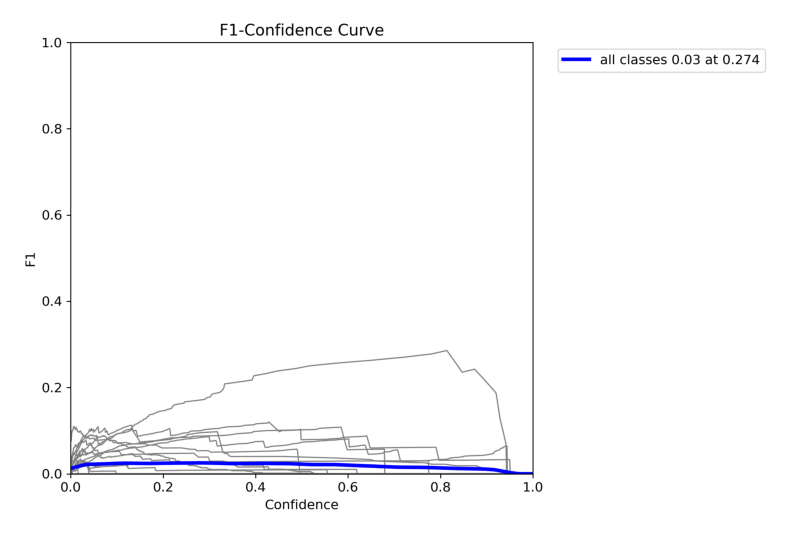


labels.jpg


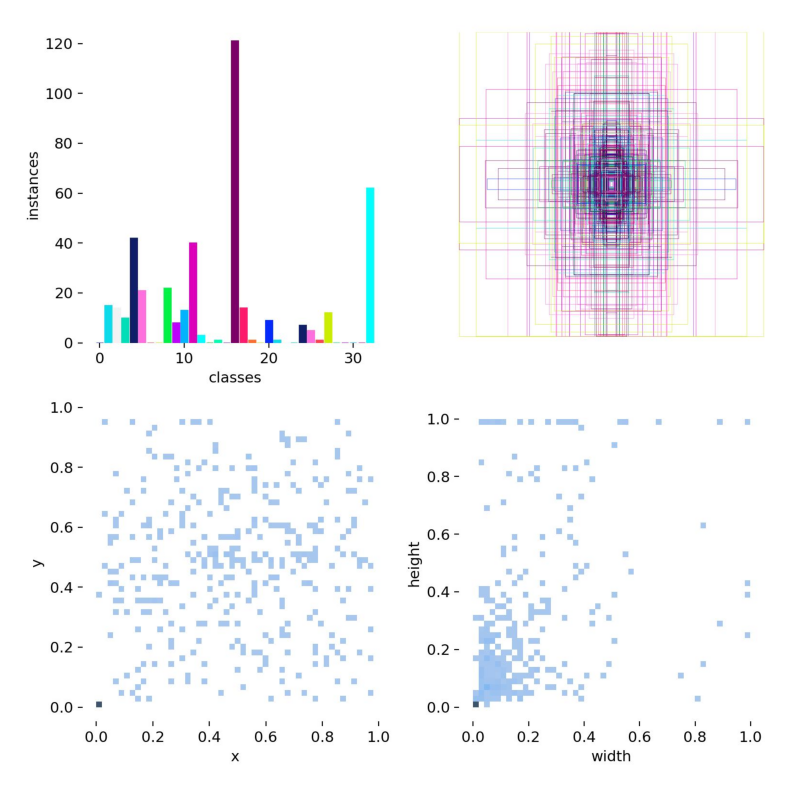


labels_correlogram.jpg


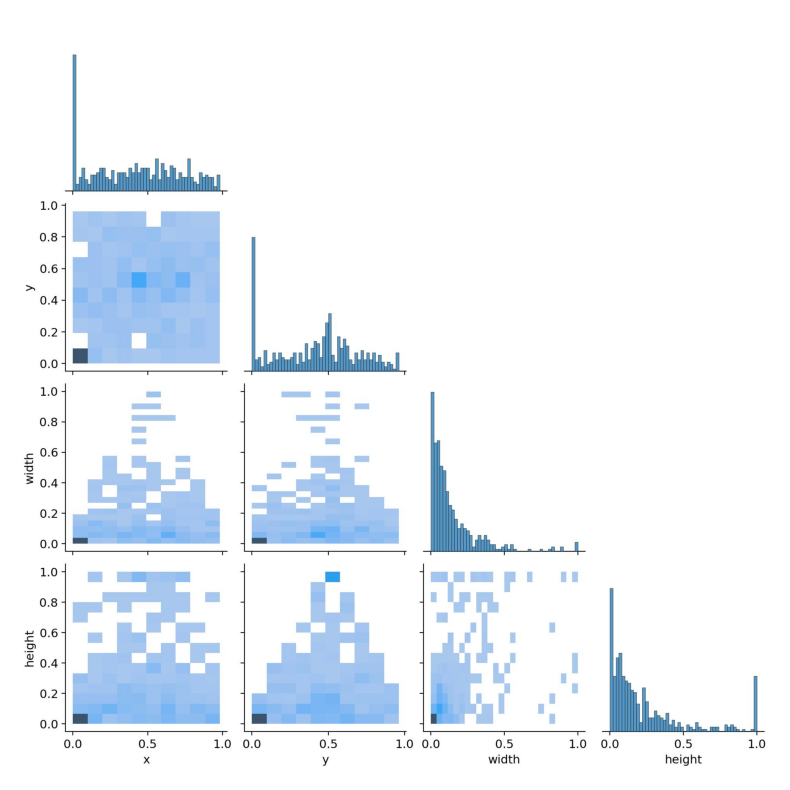


PR_curve.png


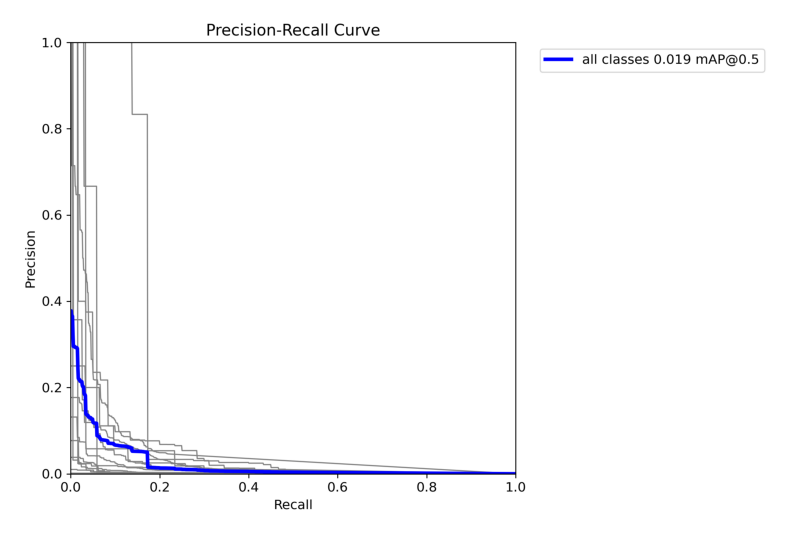


P_curve.png


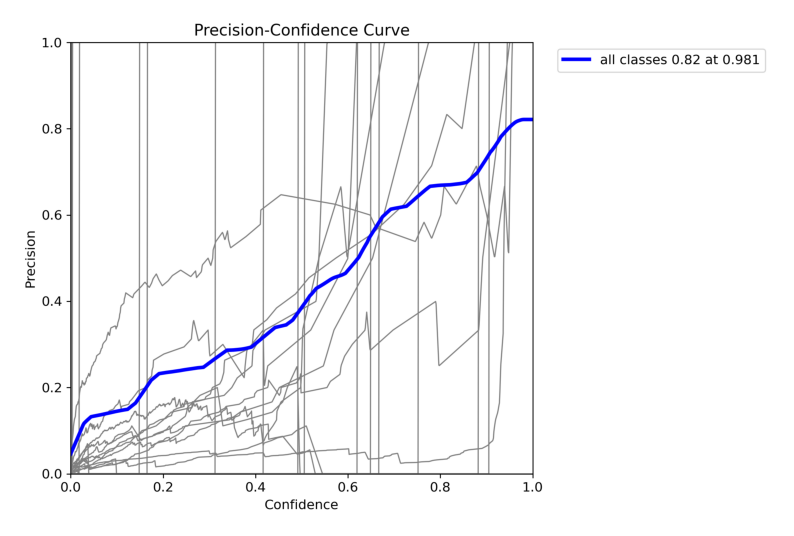


results.png


<Figure size 1000x1000 with 0 Axes>

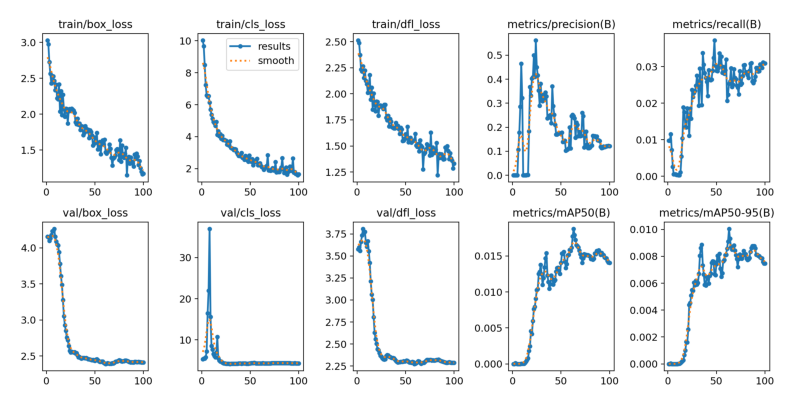


R_curve.png


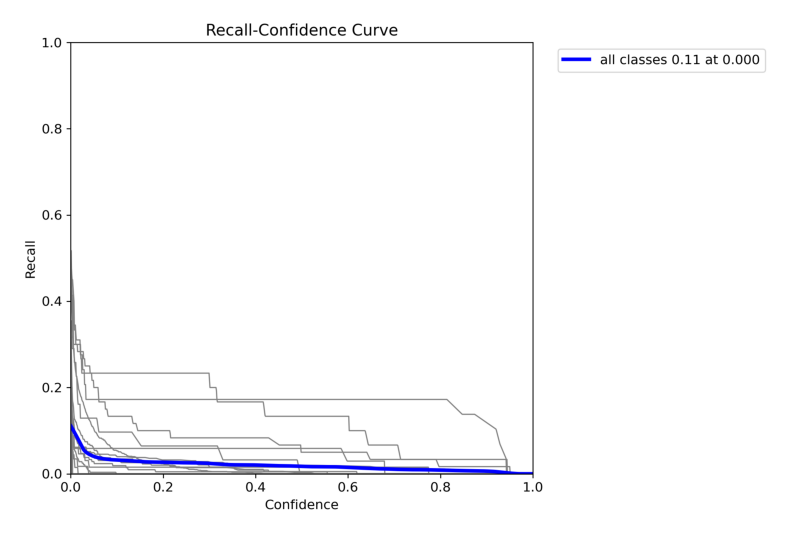


train_batch0.jpg


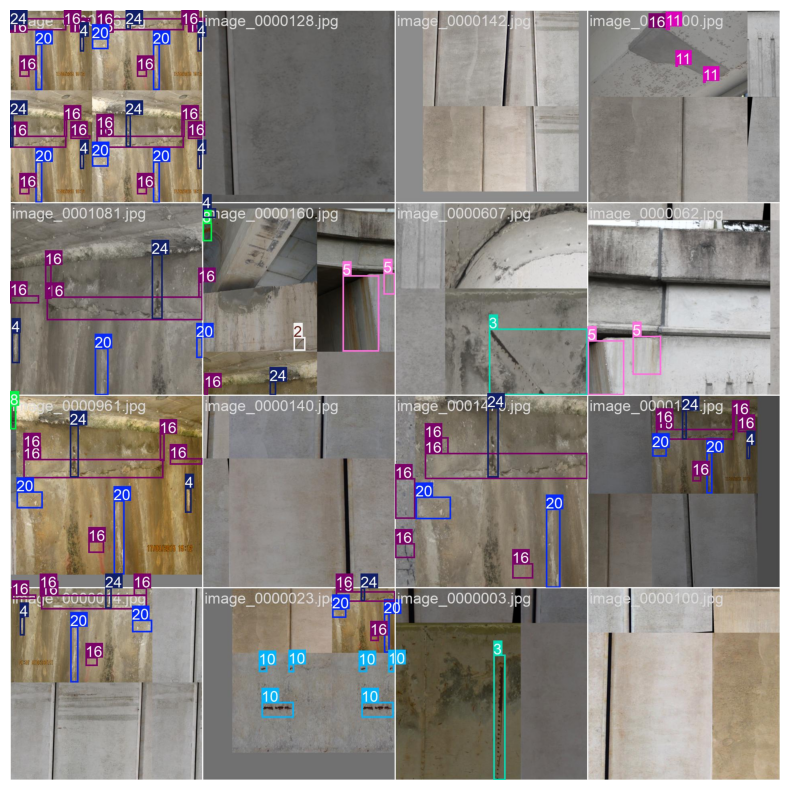


train_batch1.jpg


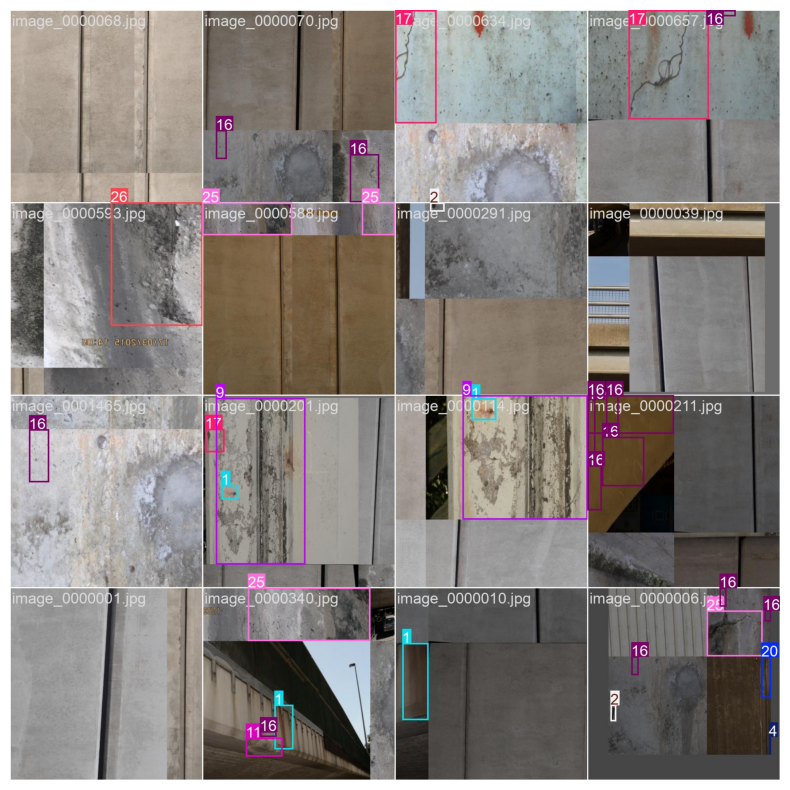


train_batch2.jpg


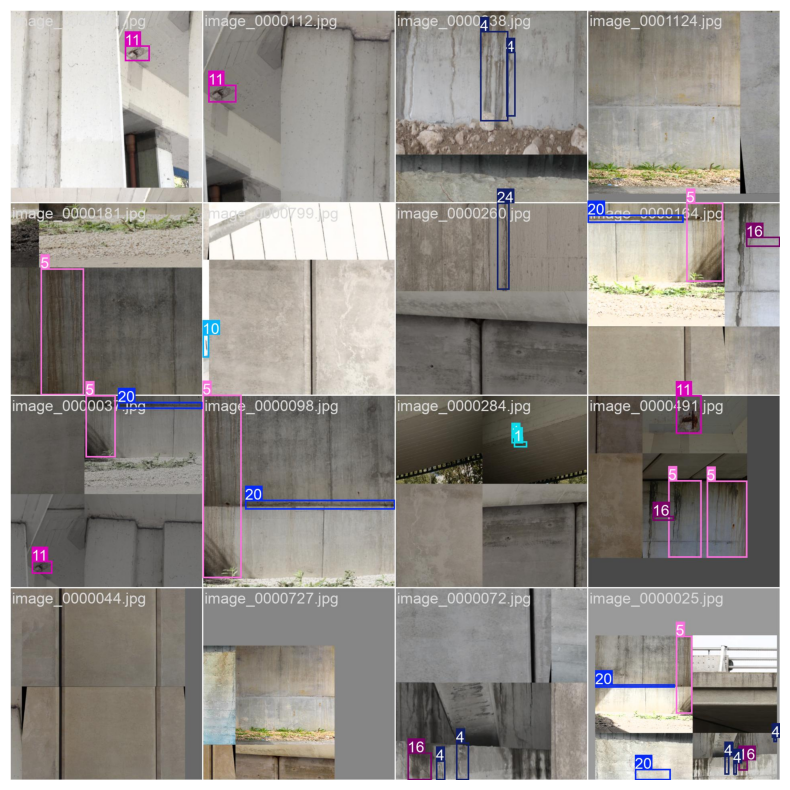


train_batch720.jpg


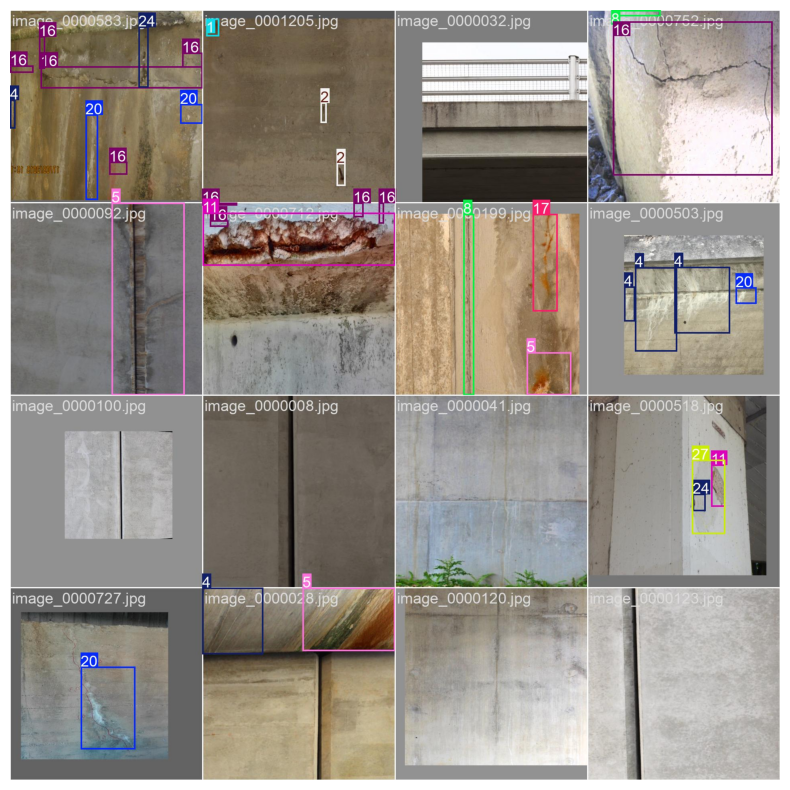


train_batch721.jpg


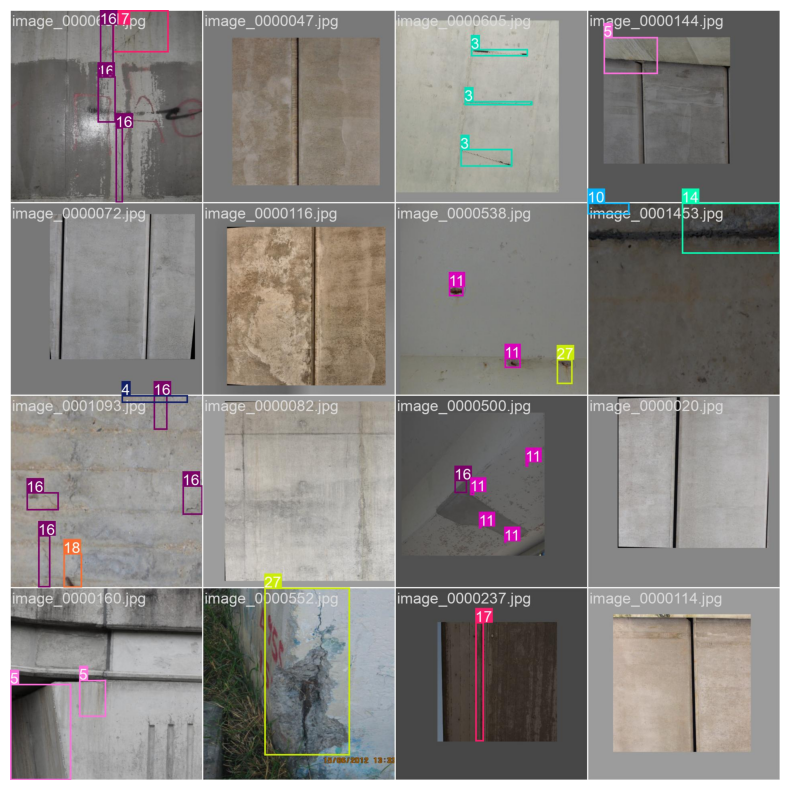


train_batch722.jpg


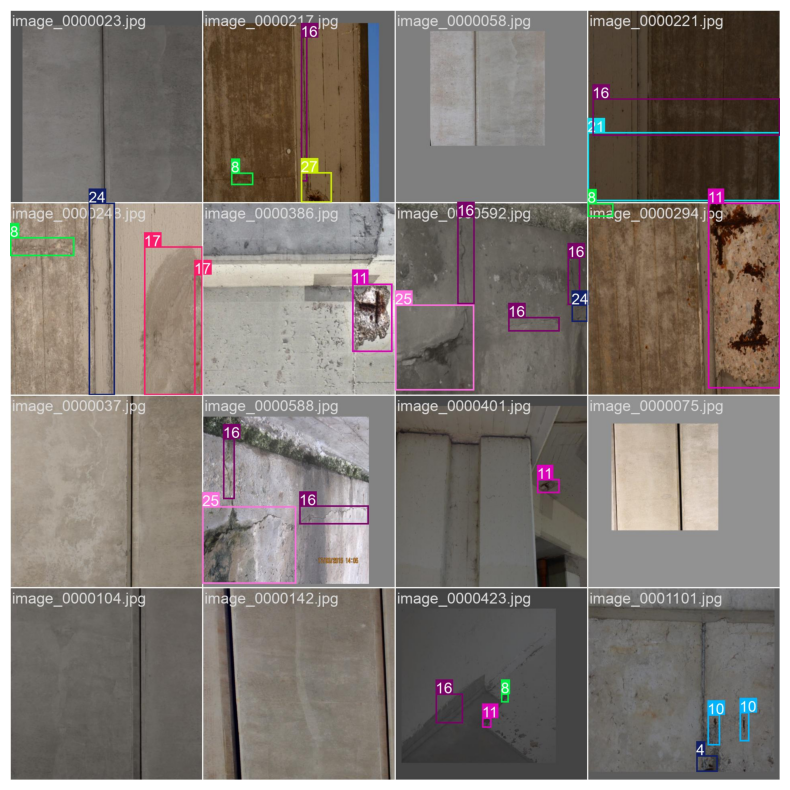


val_batch0_labels.jpg


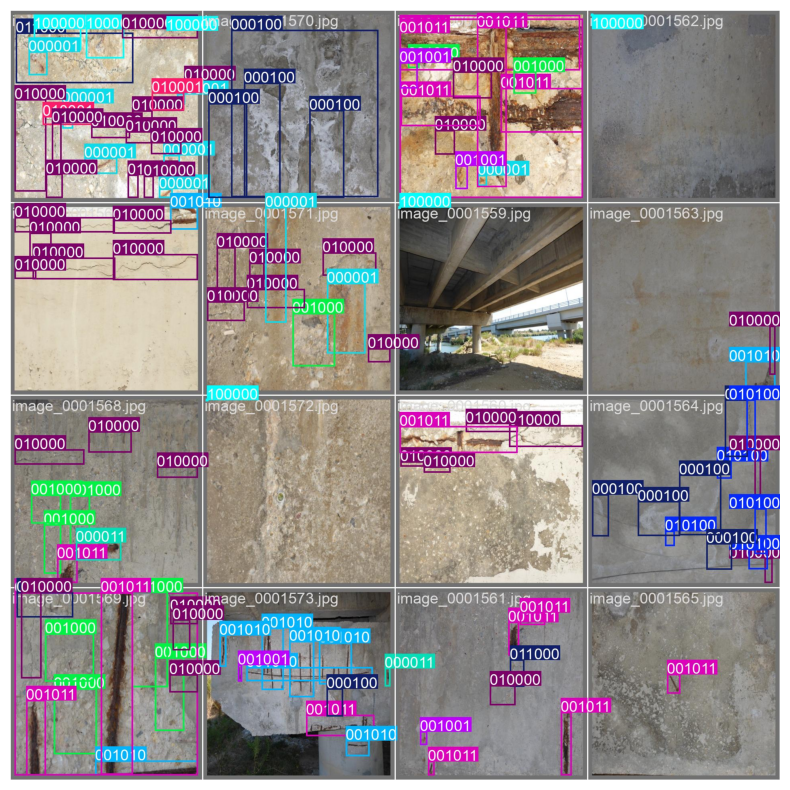


val_batch0_pred.jpg


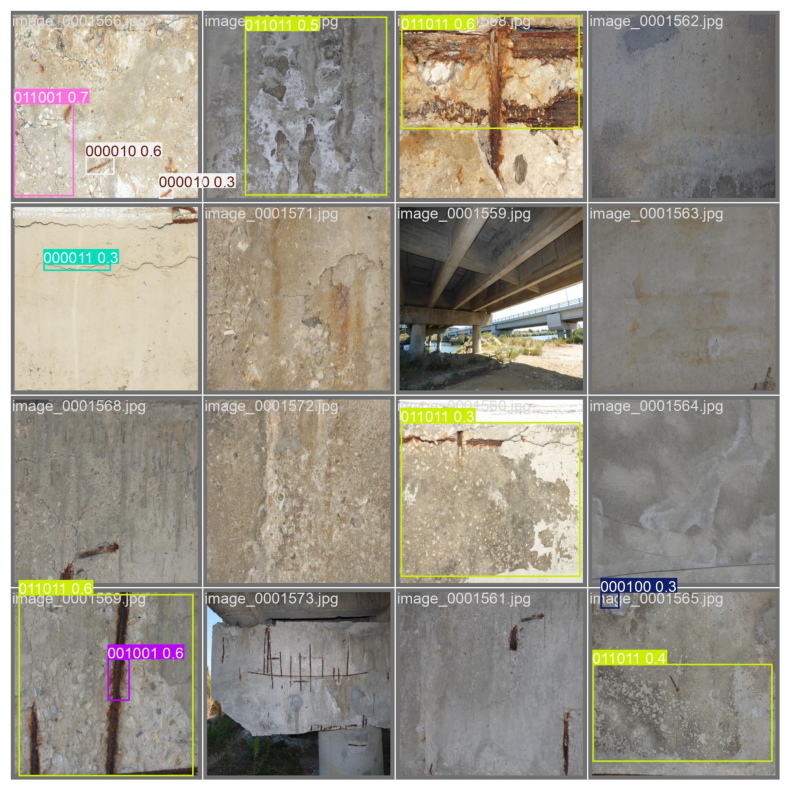


val_batch1_labels.jpg


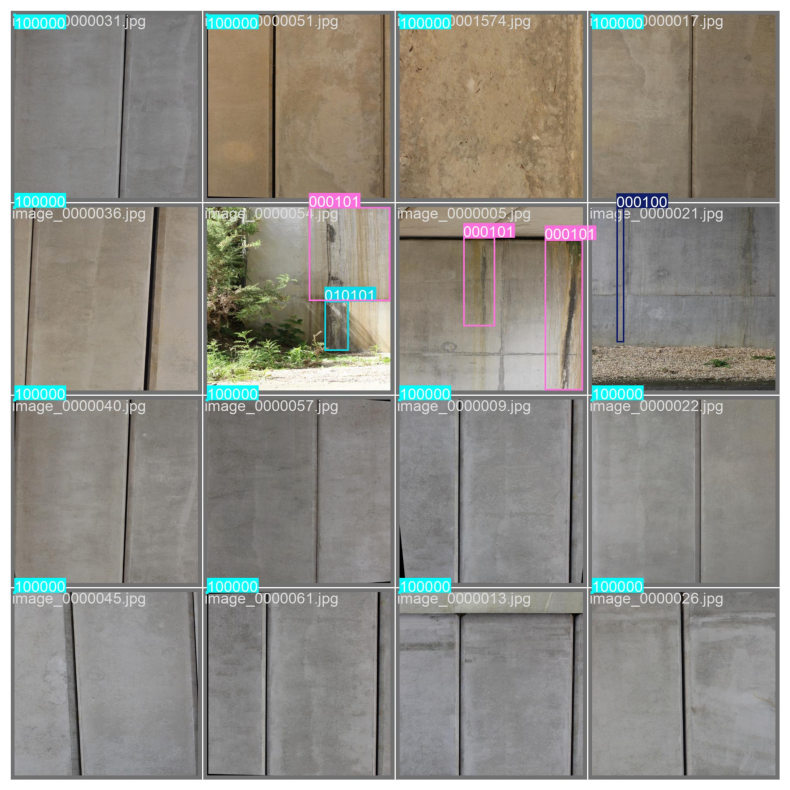


val_batch1_pred.jpg


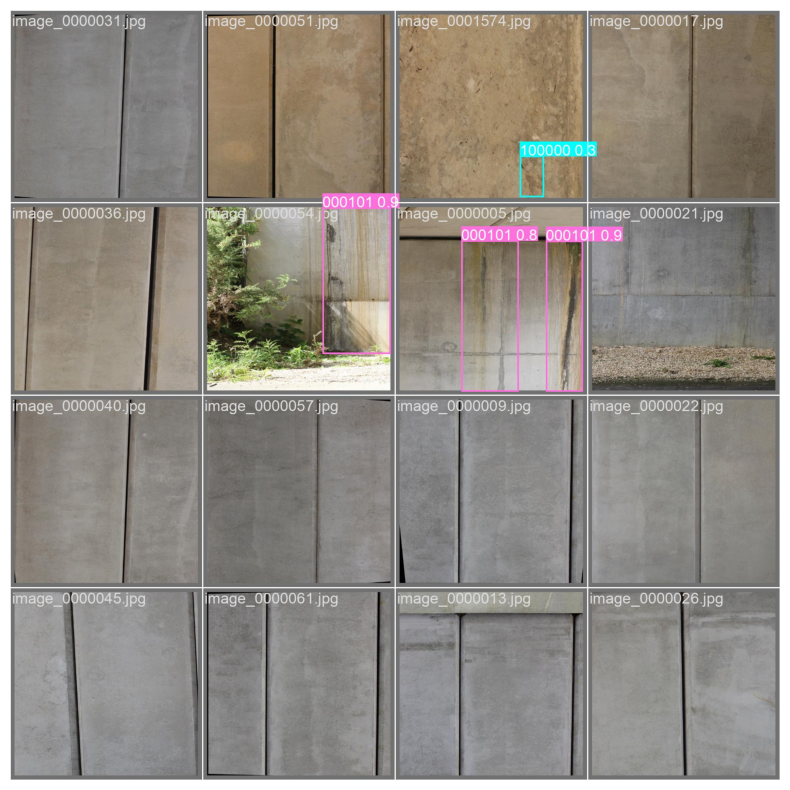


val_batch2_labels.jpg


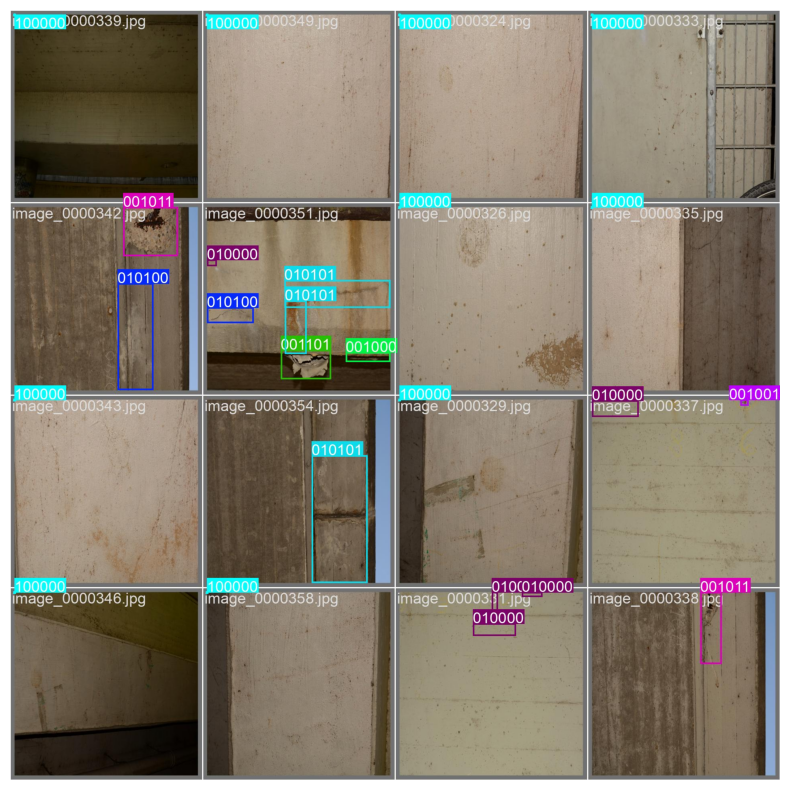


val_batch2_pred.jpg


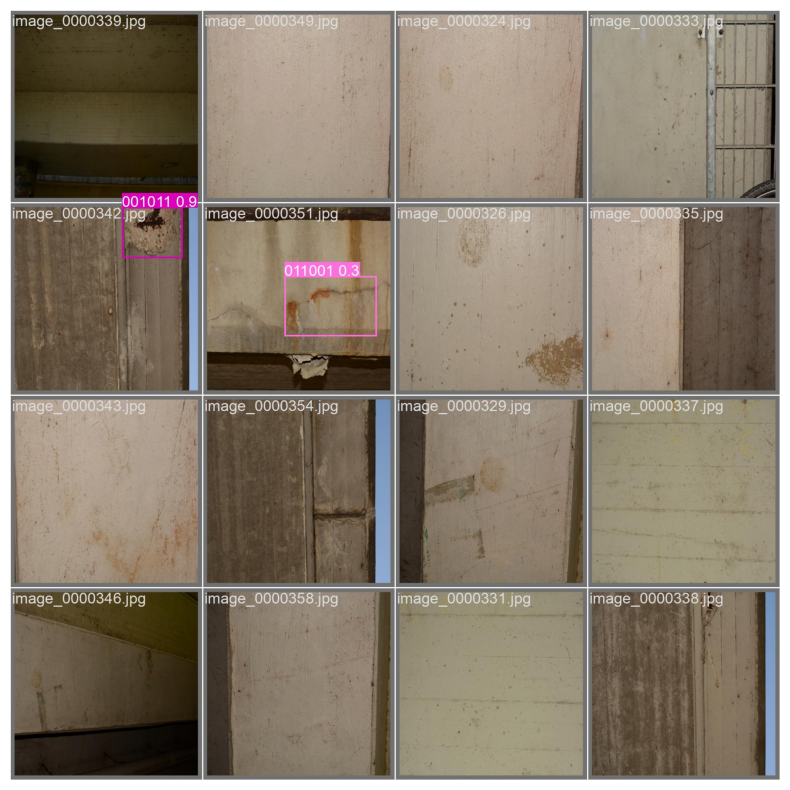

<Figure size 1000x1000 with 0 Axes>

In [14]:
train_results_path = os.path.join(os.getcwd(), r'runs\detect\train6')
train_results = os.listdir(os.path.join(os.getcwd(), r'runs\detect\train6'))


for img_path in train_results:
    plt.figure(figsize=(10, 10))

    if img_path.endswith('.png') or img_path.endswith('.jpg'):
        print(img_path)
        img = np.asarray(Image.open(os.path.join(train_results_path, img_path)))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        print()